In [7]:
!pip install librosa matplotlib noisereduce


# Studying Bird Sounds from Audio Files

In this notebook, we will analyze audio files containing various sounds (including noise, birds, and animals). 
The goal is to filter out noise and extract the sounds of migrating birds, using signal processing techniques.

1. 


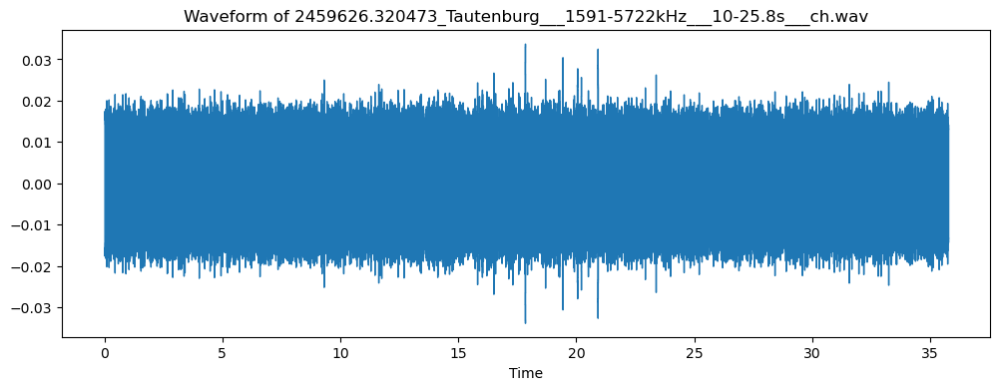

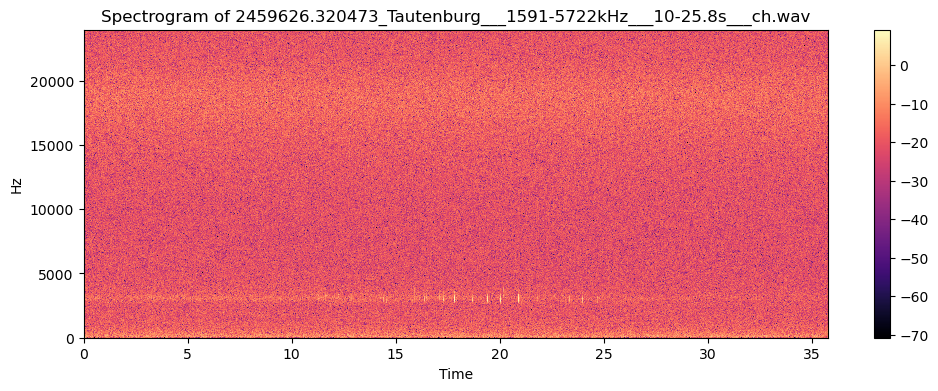

In [2]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import os

# Set the directory path
directory = r'D:\Professional\Projects\Biodiversity\final\analysis_task\Data\External\material_Bird Fly monitoring and analyse\material_Bird Fly monitoring and analyse\2n_data material\Audiodateien'

# List of specific audio files you want to analyze (include the .wav extension)
specific_files = [
    '2459626.320473_Tautenburg___1591-5722kHz___10-25.8s___ch.wav',
    # '2460413.470367_Tautenburg___382-4228kHz___10-30.6s___mh.wav',
    # '2460415.439672_Tautenburg___6181-11013kHz___10-11.4s___st.wav',
    # 'file3.wav'
    # Add more filenames as needed
]

# Loop through the specified files
for filename in specific_files:
    audio_file = os.path.join(directory, filename)
    
    # Check if the file exists
    if os.path.isfile(audio_file):
        audio, sr = librosa.load(audio_file, sr=None, mono=True)
        
        # Plot waveform
        plt.figure(figsize=(12, 4))
        librosa.display.waveshow(audio, sr=sr)
        plt.title(f'Waveform of {filename}')
        plt.show()
        
        # Plot spectrogram
        X = librosa.stft(audio)
        Xdb = librosa.amplitude_to_db(abs(X))
        plt.figure(figsize=(12, 4))
        librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
        plt.colorbar()
        plt.title(f'Spectrogram of {filename}')
        plt.show()
    else:
        print(f"File {filename} does not exist in the specified directory.")


In [3]:
import IPython
from IPython.display import Audio

# Loop through the specified files and play the audio
for filename in specific_files:
    audio_file = os.path.join(directory, filename)
    
    # Check if the file exists
    if os.path.isfile(audio_file):
        audio, sr = librosa.load(audio_file, sr=None, mono=True)
        
        # Play the audio
        IPython.display.display(Audio(audio, rate=sr))
    else:
        print(f"File {filename} does not exist in the specified directory.")


Processing file: 2459626.192622_Tautenburg___6589-9171kHz___10-10.9s___b..wav
SNR before noise reduction: 0.00 dB
SNR after noise reduction: 0.13 dB
Mean Squared Error (MSE): 0.000025



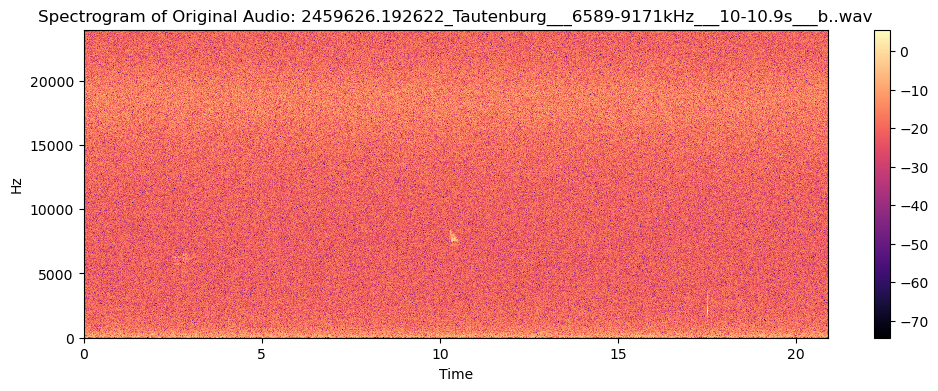

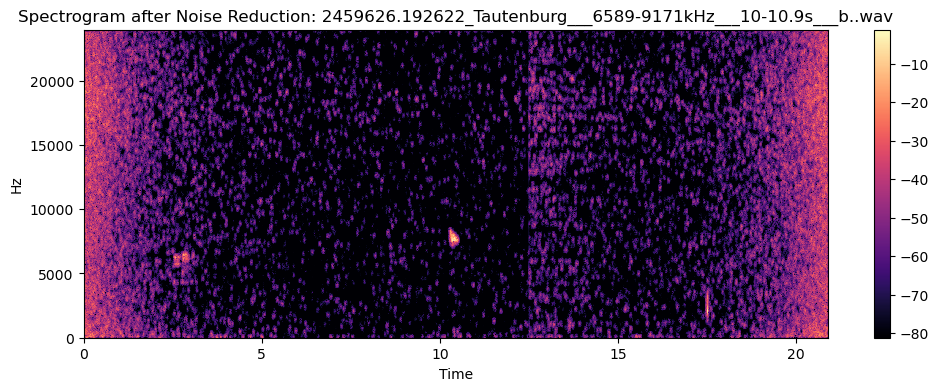

Processing file: 2459626.320473_Tautenburg___1591-5722kHz___10-25.8s___ch.wav
SNR before noise reduction: 0.00 dB
SNR after noise reduction: 0.10 dB
Mean Squared Error (MSE): 0.000025



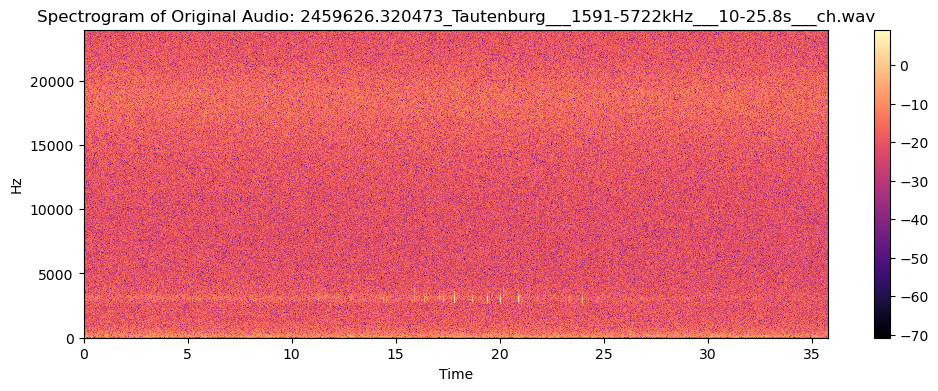

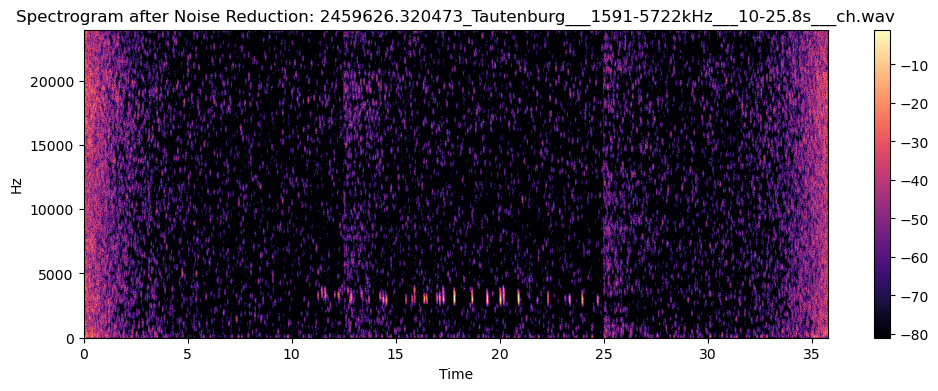

In [10]:
import noisereduce as nr
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import os

# Specify the directory containing your audio files
directory = r'D:\Professional\Projects\Biodiversity\final\analysis_task\Data\Raw'  # Use raw string for Windows paths

# Find all audio files in the directory with .wav extension
audio_files = librosa.util.find_files(directory, ext=['wav'])

# Initialize lists to store results
results = []

for file in audio_files:
    # Load audio file
    y, sr = librosa.load(file, sr=None)
    
    # Assume first 0.5 seconds is noise for profile
    noise_sample = y[0:int(0.5 * sr)]

    # Perform noise reduction
    reduced_noise_audio = nr.reduce_noise(
        y=y,
        sr=sr,
        y_noise=noise_sample,
        prop_decrease=1.0,
        stationary=False
    )

    # Function to calculate SNR
    def calculate_snr(original_audio, noise_reduced_audio):
        signal_power = np.mean(original_audio**2)
        noise = original_audio - noise_reduced_audio
        noise_power = np.mean(noise**2)
        return 10 * np.log10(signal_power / noise_power)

    # Calculate SNR before and after noise reduction
    snr_before = calculate_snr(y, np.zeros_like(y))  # Original audio vs silence
    snr_after = calculate_snr(y, reduced_noise_audio)

    # Calculate MSE
    mse_value = mean_squared_error(y, reduced_noise_audio)

    # Print results for current audio file
    print(f"Processing file: {os.path.basename(file)}")
    print(f"SNR before noise reduction: {snr_before:.2f} dB")
    print(f"SNR after noise reduction: {snr_after:.2f} dB")
    print(f"Mean Squared Error (MSE): {mse_value:.6f}\n")

    # Store results for later use (if needed)
    results.append({
        'file': file,
        'snr_before': snr_before,
        'snr_after': snr_after,
        'mse': mse_value,
        'original_audio': y,
        'reduced_noise_audio': reduced_noise_audio,
        'sr': sr
    })

    # Plot the spectrogram of the original audio
    plt.figure(figsize=(12, 4))
    X = librosa.stft(y)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.title(f'Spectrogram of Original Audio: {os.path.basename(file)}')
    plt.show()

    # Plot the spectrogram after noise reduction
    plt.figure(figsize=(12, 4))
    X_reduced = librosa.stft(reduced_noise_audio)
    Xdb_reduced = librosa.amplitude_to_db(abs(X_reduced))
    librosa.display.specshow(Xdb_reduced, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.title(f'Spectrogram after Noise Reduction: {os.path.basename(file)}')
    plt.show()


D:\Professional\Projects\Biodiversity\final\analysis_task\Data\Raw\2459626.192622_Tautenburg___6589-9171kHz___10-10.9s___b..wav


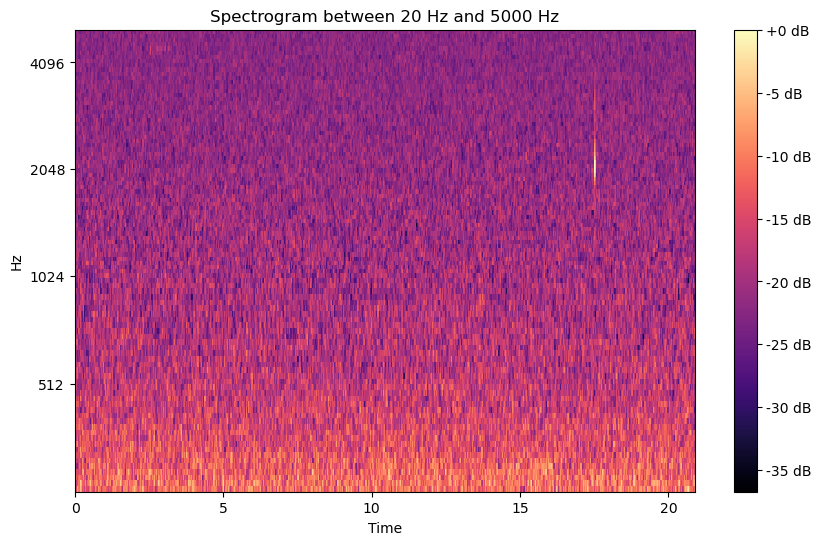

D:\Professional\Projects\Biodiversity\final\analysis_task\Data\Raw\2459626.320473_Tautenburg___1591-5722kHz___10-25.8s___ch.wav


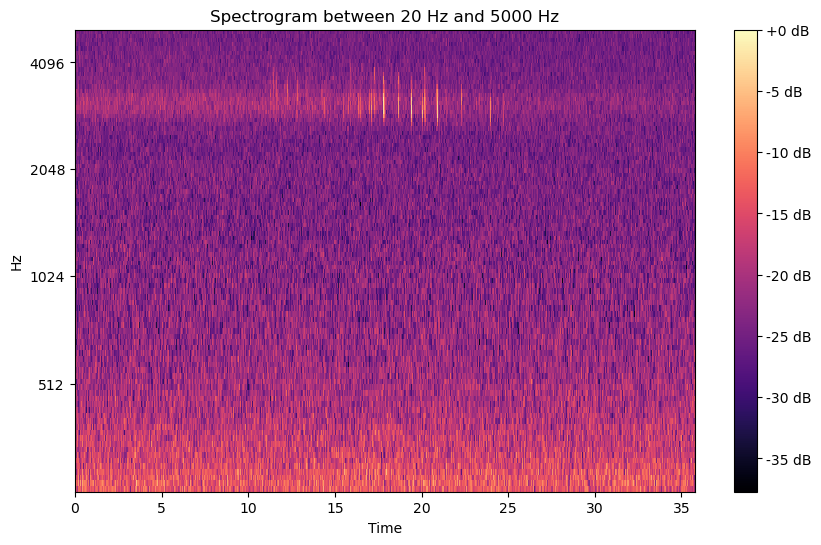

In [11]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import re

# Specify the directory containing your audio files
directory = r'D:\Professional\Projects\Biodiversity\final\analysis_task\Data\Raw'  # Use raw string for Windows paths

# Find all audio files in the directory with .wav extension
audio_files = librosa.util.find_files(directory, ext=['wav'])
# Example filename with frequency range in Hz (e.g., "audio_1000_5000Hz.wav")

for filename in audio_files:
    print(filename)

    # Extract frequency range from the filename
    match = True #re.search(r"_(\d+)_(\d+)Hz", filename)
    if match:
        freq_min = 20 #int(match.group(1))  # Lower bound of frequency
        freq_max = 5000 #int(match.group(2))  # Upper bound of frequency
    else:
        raise ValueError("Filename doesn't contain a valid frequency range")

    # Load the audio file
    y, sr = librosa.load(filename)

    # Compute the spectrogram
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_dB = librosa.power_to_db(S, ref=np.max)

    # Get the corresponding frequency values for the mel spectrogram
    mel_frequencies = librosa.mel_frequencies(n_mels=S.shape[0], fmin=0, fmax=sr/2)

    # Find indices for the desired frequency range
    freq_indices = np.where((mel_frequencies >= freq_min) & (mel_frequencies <= freq_max))[0]

    # Plot the spectrogram within the desired frequency range
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_dB[freq_indices, :], sr=sr, x_axis='time', y_axis='mel', fmin=freq_min, fmax=freq_max)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Spectrogram between {freq_min} Hz and {freq_max} Hz")
    plt.show()


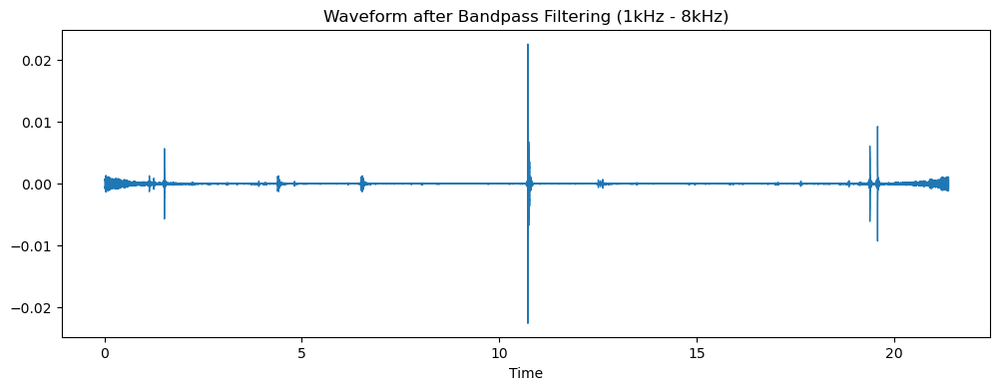

In [13]:
from scipy.signal import butter, filtfilt

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

lowcut = 1000.0  # 1 kHz
highcut = 8000.0  # 8 kHz
filtered_audio = bandpass_filter(reduced_noise_audio, lowcut, highcut, sr)

# Plot the filtered waveform
plt.figure(figsize=(12, 4))
librosa.display.waveshow(filtered_audio, sr=sr)
plt.title('Waveform after Bandpass Filtering (1kHz - 8kHz)')
plt.show()


Onset times of detected bird sounds: [ 0.032       1.14133333  1.48266667  1.51466667  1.90933333  2.19733333
  3.36        4.          4.352       4.39466667  4.77866667  4.82133333
  6.47466667  6.50666667  8.02133333  9.696      10.72       12.512
 17.00266667 17.61066667 19.34933333 19.392      19.54133333 19.584
 20.90666667]


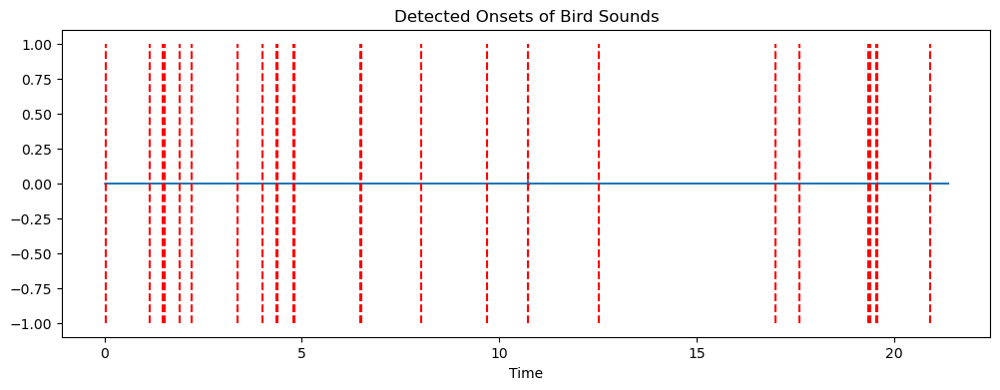

In [14]:
onset_frames = librosa.onset.onset_detect(y=filtered_audio, sr=sr)
onset_times = librosa.frames_to_time(onset_frames, sr=sr)

print("Onset times of detected bird sounds:", onset_times)

# Plot onset markers on the waveform
plt.figure(figsize=(12, 4))
librosa.display.waveshow(filtered_audio, sr=sr)
plt.vlines(onset_times, ymin=-1, ymax=1, color='r', linestyle='--', label='Onsets')
plt.title('Detected Onsets of Bird Sounds')
plt.show()


In [15]:
# Extract bird sound segments based on onset detection
for i, onset in enumerate(onset_times[:-1]):
    start_sample = int(onset * sr)
    end_sample = int(onset_times[i + 1] * sr)
    bird_segment = filtered_audio[start_sample:end_sample]
    
    # Save each segment as a separate file
    segment_filename = f'bird_segment_{i}.wav'
    librosa.output.write_wav(segment_filename, bird_segment, sr)
    print(f'Saved bird sound segment: {segment_filename}')


AttributeError: No librosa attribute output

# Analysis and Conclusion

In this notebook, we applied several signal processing techniques to filter out noise from an audio file, isolate bird sounds, and detect and extract segments containing migrating bird calls.

Future steps:
- Experiment with different frequency ranges.
- Use machine learning models like BirdNET to further refine bird sound identification.


# based on the work of 

Directory exists.
SNR for D:\Professional\Projects\Biodiversity\final\analysis_task\Data\External\material_Bird Fly monitoring and analyse\material_Bird Fly monitoring and analyse\2n_data material\Audiodateien\2459626.320473_Tautenburg___1591-5722kHz___10-25.8s___ch.wav: -16.39 dB


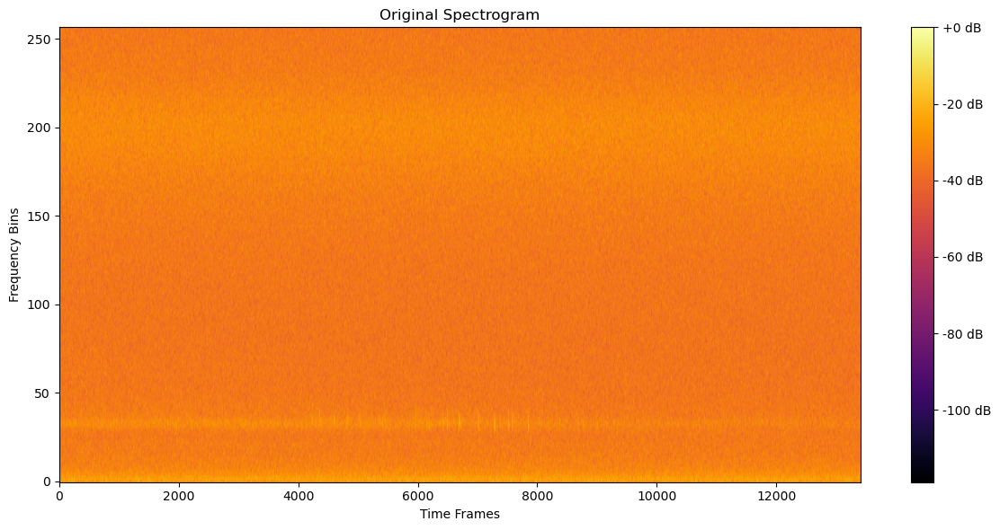

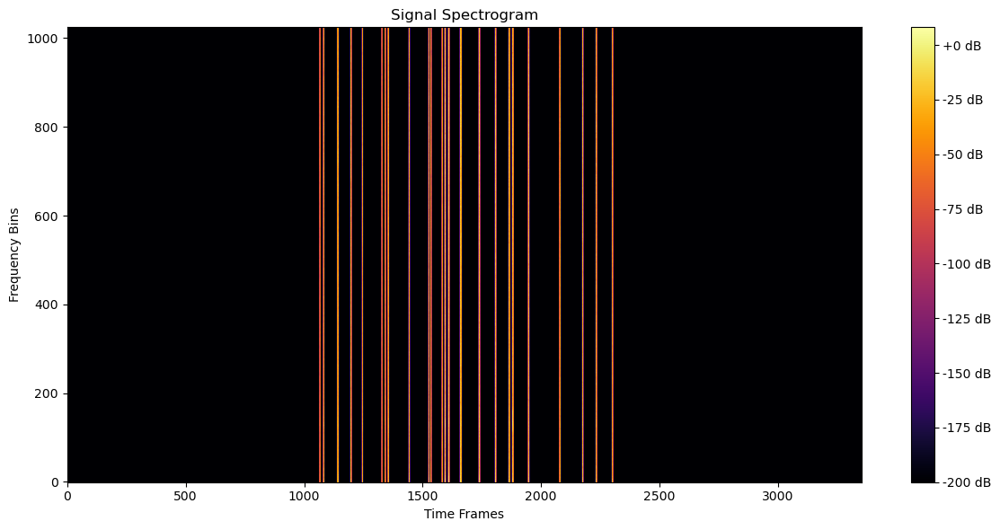

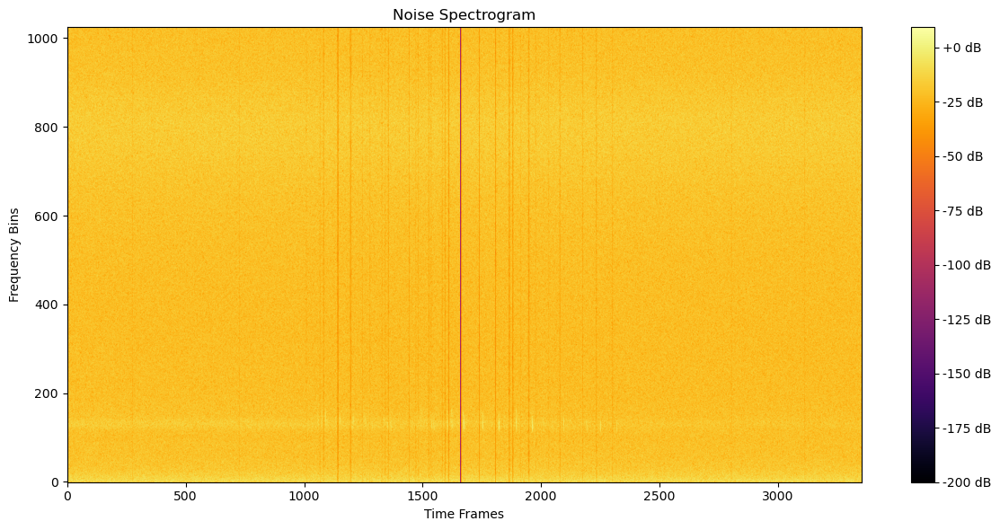

In [38]:
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_erosion, binary_dilation
import soundfile as sf

# Set the directory path
directory = r'D:\Professional\Projects\Biodiversity\final\analysis_task\Data\External\material_Bird Fly monitoring and analyse\material_Bird Fly monitoring and analyse\2n_data material\Audiodateien'

# List of specific audio files you want to analyze (include the .wav extension)
specific_files = [
    '2459626.320473_Tautenburg___1591-5722kHz___10-25.8s___ch.wav',
    # Add more filenames as needed
]

def process_audio_file(audio_file):
    """Process the audio file to separate signal and noise."""
    try:
        audio, sr = librosa.load(audio_file, sr=None, mono=True)

        # Compute the spectrogram
        stft = librosa.stft(audio, n_fft=512, hop_length=128, window='hann')
        spectrogram = np.abs(stft)

        # Normalize the spectrogram to the range [0, 1]
        spectrogram_norm = spectrogram / np.max(spectrogram)

        # Compute row and column medians
        row_medians = np.median(spectrogram_norm, axis=1)
        col_medians = np.median(spectrogram_norm, axis=0)

        # Select pixels for the signal part (3 times bigger than medians)
        signal_mask = (spectrogram_norm > 3 * row_medians[:, None]) & (spectrogram_norm > 3 * col_medians[None, :])
        signal_mask = binary_dilation(binary_erosion(signal_mask, iterations=1), iterations=1)

        # Create an indicator vector for the signal part
        signal_indicator = np.any(signal_mask, axis=0)
        signal_indicator = binary_dilation(signal_indicator, iterations=2)

        # Scale the signal indicator vector to match audio length
        signal_indicator_scaled = scale_indicator(signal_indicator, len(audio))

        # Apply the signal mask to extract the signal part
        signal = audio * signal_indicator_scaled

        # Compute noise mask using a threshold of 2.5 times medians
        noise_mask = (spectrogram_norm > 2.5 * row_medians[:, None]) & (spectrogram_norm > 2.5 * col_medians[None, :])
        noise_mask = binary_dilation(binary_erosion(noise_mask, iterations=1), iterations=1)
        
        noise_indicator = np.any(noise_mask, axis=0)
        noise_indicator = binary_dilation(noise_indicator, iterations=2)

        # Scale and pad noise indicator vector
        noise_indicator_scaled = scale_indicator(noise_indicator, len(audio))

        # Apply the noise mask to extract the noise part
        noise = audio * (1 - noise_indicator_scaled)

        # Save the signal and noise parts
        sf.write('signal.wav', signal, sr)
        sf.write('noise.wav', noise, sr)

        # Calculate SNR
        snr_value = calculate_snr(signal, noise)
        print(f"SNR for {audio_file}: {snr_value:.2f} dB")

        # Return processed results for plotting later
        return audio, spectrogram_norm, signal, noise, sr

    except Exception as e:
        print(f"Error processing {audio_file}: {e}")

def scale_indicator(indicator, audio_length):
    """Scale and pad indicator vector to match audio length."""
    scaled_indicator = np.repeat(indicator, int(audio_length / len(indicator)))
    
    if len(scaled_indicator) > audio_length:
        return scaled_indicator[:audio_length]
    elif len(scaled_indicator) < audio_length:
        return np.pad(scaled_indicator, (0, audio_length - len(scaled_indicator)), 'constant')
    
    return scaled_indicator

def plot_spectrogram(spectrogram_norm, title='Spectrogram'):
    """Plot the normalized spectrogram."""
    plt.figure(figsize=(12, 6))
    plt.imshow(20 * np.log10(spectrogram_norm + 1e-10), aspect='auto', origin='lower', cmap='inferno')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel('Time Frames')
    plt.ylabel('Frequency Bins')
    plt.tight_layout()
    plt.show()
    
def calculate_snr(signal, noise):
    """Calculate Signal-to-Noise Ratio (SNR)."""
    # Calculate power of signal and noise
    power_signal = np.mean(signal**2)
    power_noise = np.mean(noise**2)

    if power_noise == 0:  # Avoid division by zero
        return float('inf')  # Infinite SNR if there's no noise

    snr_value = 10 * np.log10(power_signal / power_noise)
    return snr_value

# Check if the directory exists before processing files
if os.path.exists(directory):
    print('Directory exists.')
    
    for filename in specific_files:
        audio_file_path = os.path.join(directory, filename)
        
        if os.path.isfile(audio_file_path):
            audio, spectrogram_norm, signal, noise, sr = process_audio_file(audio_file_path)
            
            # Plot original and processed spectrograms
            plot_spectrogram(spectrogram_norm, title='Original Spectrogram')
            plot_spectrogram(np.abs(librosa.stft(signal)), title='Signal Spectrogram')
            plot_spectrogram(np.abs(librosa.stft(noise)), title='Noise Spectrogram')

        else:
            print(f"File {filename} does not exist in the specified directory.")
else:
    print('Directory does not exist.')
